In [26]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import matplotlib.image as mpimg
import math
import dask.dataframe as dd

from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from string import ascii_letters
import dask.dataframe as dd
from sklearn.preprocessing import MinMaxScaler
from sklearn.linear_model import LinearRegression
from sklearn import metrics

In [27]:
! pip install phik
import phik
from phik.report import plot_correlation_matrix

In [28]:
pip install pandas-profiling

Note: you may need to restart the kernel to use updated packages.


In [29]:
from pandas_profiling import ProfileReport as pp

In [30]:
!pip install feature_engine
from feature_engine.encoding import RareLabelEncoder as RareLabelCategoricalEncoder

In [31]:
from sklearn.ensemble import RandomForestRegressor
!pip install xgboost
import xgboost as xgb
from sklearn.inspection import permutation_importance
from sklearn.model_selection import RandomizedSearchCV

In [32]:
# Load Canadian dataset 
df = pd.read_csv("ca-dealers-used.csv",dtype={'fuel_type': 'object', 'engine_block': 'object'})

In [33]:
# Check the datatypes of each attributes
df.dtypes

id               object
vin              object
price           float64
miles           float64
stock_no         object
year            float64
make             object
model            object
trim             object
body_type        object
vehicle_type     object
drivetrain       object
transmission     object
fuel_type        object
engine_size     float64
engine_block     object
seller_name      object
street           object
city             object
state            object
zip              object
dtype: object

In [34]:
# check total number of records for the raw data
len(df)

393603

In [35]:
# first 5 records
df.head(5)

,id,vin,price,miles,stock_no,year,make,model,trim,body_type,...,drivetrain,transmission,fuel_type,engine_size,engine_block,seller_name,street,city,state,zip
0,b39ea795-eca9,19UNC1B01HY800062,179999.0,9966.0,V-P4139,2017.0,Acura,NSX,Base,Coupe,...,4WD,Automatic,Electric / Premium Unleaded,3.5,V,edmundston honda,475 Rue Victoria,Edmundston,NB,E3V 2K7
1,026cb5b1-6e3e,19UNC1B02HY800023,179995.0,5988.0,PPAP70374,2017.0,Acura,NSX,Base,Coupe,...,4WD,Automatic,Electric / Premium Unleaded,3.5,V,garage daniel lessard,2795 Route-du-prsident-kennedy,Notre-dame-des-pins,QC,G0M 1K0
2,5cd5d5b2-5cc2,19UNC1B02HY800071,168528.0,24242.0,B21085,2017.0,Acura,NSX,Base,Coupe,...,4WD,Automatic,Electric / Premium Unleaded,3.5,V,lougheed acura,1388 Lougheed Highway,Coquitlam,BC,V3K 6S4
3,b32473ed-5922,19UNC1B02LY800001,220000.0,6637.0,AP5333,2020.0,Acura,NSX,Base,Coupe,...,4WD,Automatic,Electric / Premium Unleaded,3.5,V,drive autogroup,1305 Parkway Suite 600,Pickering,ON,L1V 3P2
4,ac40c9fc-0676,19UNC1B02LY800001,220000.0,6637.0,AP5333,2020.0,Acura,NSX,Base,Coupe,...,4WD,Automatic,Electric / Premium Unleaded,3.5,V,acura pickering,575 Kingston Road,Pickering,ON,L1V 3N7


In [36]:
# For the first dataset, we will only select records from Toronto, ON
df=df[df.state == "ON"]

In [37]:
df=df[df.city == "Toronto"]

In [38]:
# drop irrelevant columns for this research
drop_columns = ['id', 'vin', 'stock_no', 'seller_name','street','city','state','zip']
df = df.drop(columns = drop_columns)

In [39]:
# EDA analysis
# check data types of the remainning attributes
df.dtypes

price           float64
miles           float64
year            float64
make             object
model            object
trim             object
body_type        object
vehicle_type     object
drivetrain       object
transmission     object
fuel_type        object
engine_size     float64
engine_block     object
dtype: object

In [40]:
# summary of the dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 14998 entries, 39 to 393573
Data columns (total 13 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   price         13811 non-null  float64
 1   miles         13229 non-null  float64
 2   year          14998 non-null  float64
 3   make          14998 non-null  object 
 4   model         14807 non-null  object 
 5   trim          13954 non-null  object 
 6   body_type     13442 non-null  object 
 7   vehicle_type  13278 non-null  object 
 8   drivetrain    14262 non-null  object 
 9   transmission  14276 non-null  object 
 10  fuel_type     12615 non-null  object 
 11  engine_size   12607 non-null  float64
 12  engine_block  12554 non-null  object 
dtypes: float64(4), object(9)
memory usage: 1.6+ MB


In [41]:
# Check missing values in each column, as these missing values need to be handled properly
missing_values_count = df.isnull().sum()
missing_values_count

price           1187
miles           1769
year               0
make               0
model            191
trim            1044
body_type       1556
vehicle_type    1720
drivetrain       736
transmission     722
fuel_type       2383
engine_size     2391
engine_block    2444
dtype: int64

In [42]:
# Some EDA analysis on price as it is most important attribute for this research, first lets check the statistics summary and distribution of price
df['price'].describe()

count     13811.000000
mean      25069.024835
std       21359.905212
min           0.000000
25%       14855.500000
50%       20900.000000
75%       29950.000000
max      589000.000000
Name: price, dtype: float64

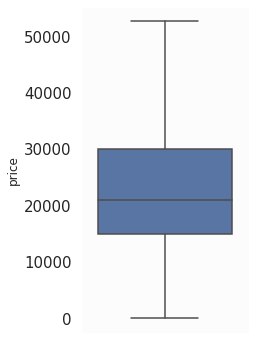

In [43]:
# Boxplot for price
plt.figure(figsize=(3,6))
sns.boxplot(y='price', data=df, showfliers=False);

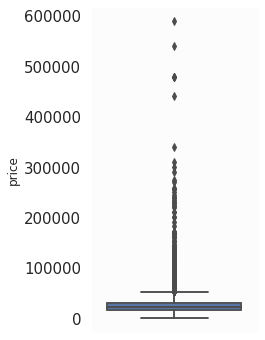

In [44]:
# Box plot for price with outliers, we can see that there are a lot extreme high prices
plt.figure(figsize=(3,6))
sns.boxplot(y='price', data=df, showfliers=False)
sns.boxplot(y='price', data=df);

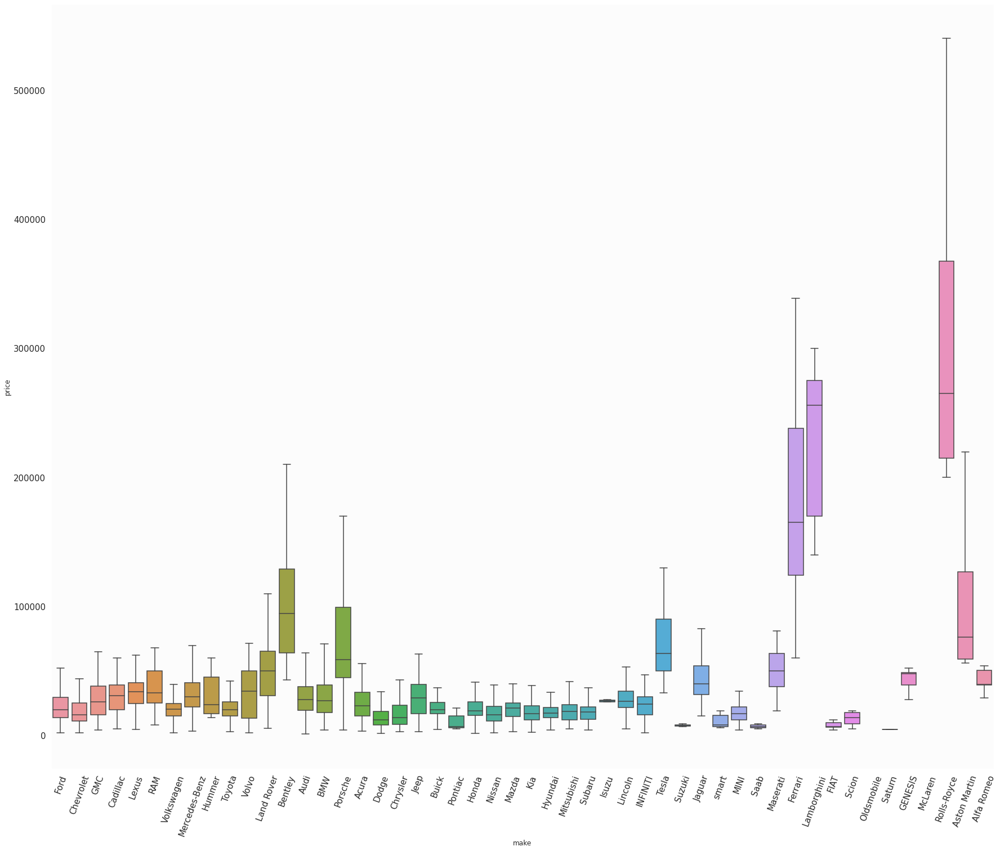

In [45]:
# Prices by different brands, some brands have high average prices and max prices
plt.figure(figsize=(30,25))
plt.xticks(rotation=70)
sns.boxplot(y='price', x='make', data=df, showfliers=False)

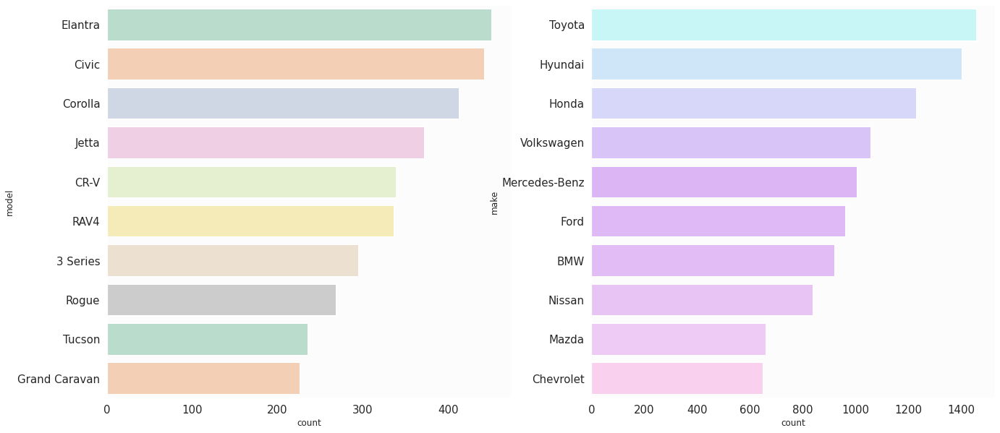

In [46]:
# Lets check some other attributes just to get familiar with our dataset. Count by top 10 most popular brand and model.
colors = ["#C0FDFF", "#C8E7FF","#D0D1FF","#D8BBFF","#DEAAFF","#E2AFFF","#E5B3FE","#ECBCFD","#F3C4FB","#FFCBF2"]
sns.set_palette(sns.color_palette(colors))


fig, ax =plt.subplots(1,2,figsize=(22, 10))
sns.set(rc={"axes.facecolor":"#fcfcfc", "axes.grid":False,'xtick.labelsize':20,'ytick.labelsize':20})
sns.countplot(y ='make',data = df,order=df.make.value_counts().iloc[:10].index, ax = ax[1],palette = colors) 
sns.countplot(y ='model',data = df,order=df.model.value_counts().iloc[:10].index, ax= ax[0],palette = "Pastel2")
fig.show()

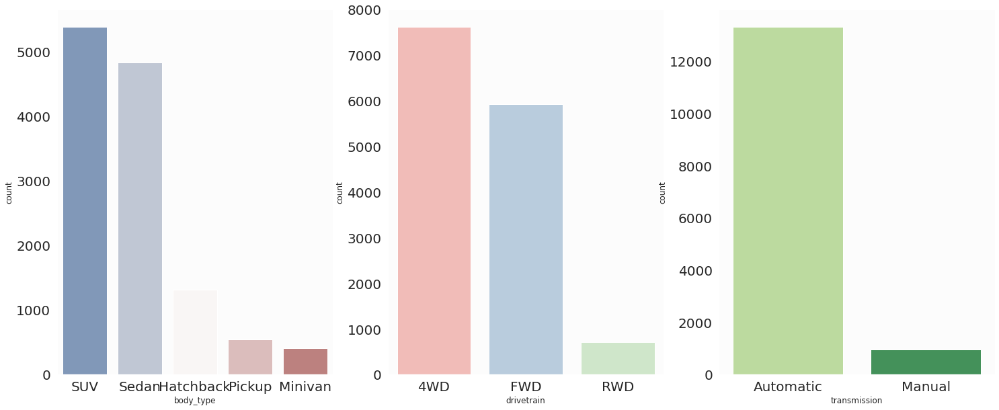

In [47]:
# Countplot by body_type, drivetrain and transmission
fig, ax =plt.subplots(1,3,figsize=(25, 10))
sns.set(rc={"axes.facecolor":"#fcfcfc", "axes.grid":False,'xtick.labelsize':15,'ytick.labelsize':15})
sns.countplot(x ='body_type',data = df,order=df.body_type.value_counts().iloc[:5].index, ax = ax[0],palette="vlag")
sns.countplot(x ='drivetrain',data = df,order=df.drivetrain.value_counts().iloc[:5].index, ax = ax[1],palette="Pastel1")
sns.countplot(x ='transmission',data = df,order=df.transmission.value_counts().iloc[:5].index, ax = ax[2],palette="YlGn")
fig.show()

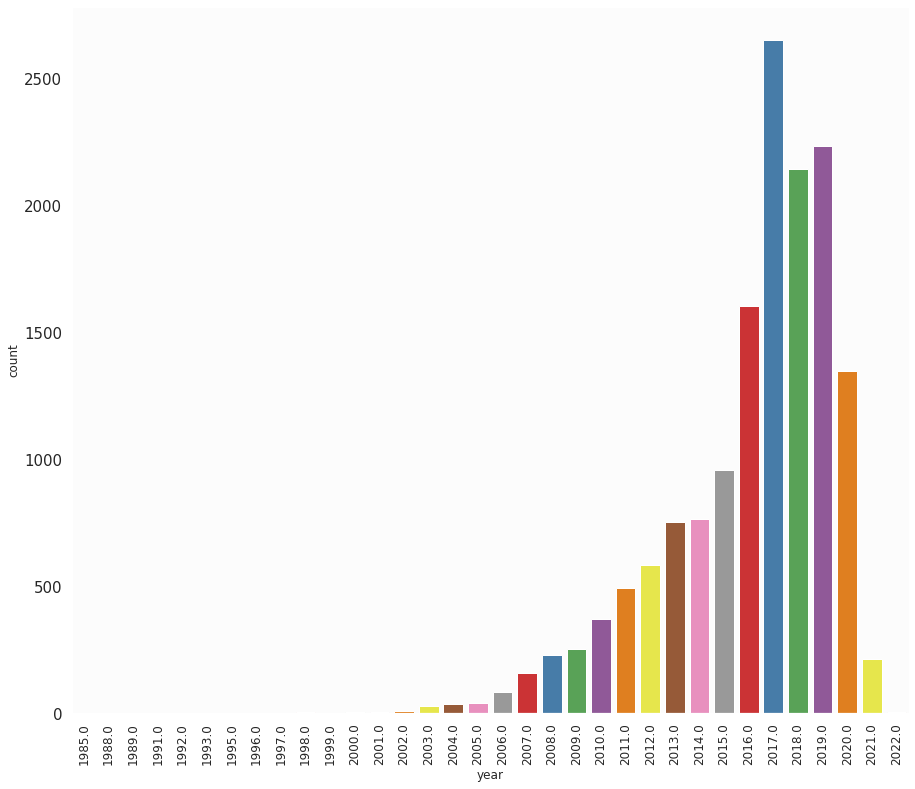

In [48]:
# Year is another important atrributes, lets use bar chart to check the number of cars by year
plt.figure(figsize=(15, 13))
ax = sns.countplot(x = 'year', data=df, palette='Set1')
ax.set_xticklabels(ax.get_xticklabels(), rotation=90,fontsize=12);

In [49]:
# Data cleaning and preprocessing:
# Lets drop records without prices, since these records will be useless for our analysis
df_tor=df.dropna(subset=['price'])

In [50]:
# Using pandas profiling to inspect our dataset. Pandas profiling gives you very detailed information on variables and correlations
profile = pp(df_tor)
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [51]:
# Save the profiling as 'profile_bf_cleaning_tor'
profile.to_file("profile_bf_cleaning_tor.html")

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [52]:
# check the 2 and 98 percentile of the data.
rr=sorted(df_tor["price"])
quantile1, quantile3= np.percentile(rr,[2,98])
print(quantile1,quantile3)

4999.0 72320.79999999971


In [53]:
# There are extreme values exist on both side of the distribution. Also the difference between 75% value and max value is very large so lets leave 2% values at both ends of a distribution. As extreme values will impact the performance of our model.
# From a real-world prespecitve, price range between 4990 and 72321 seems reasonable. 
# Remove records with prices <4990 and price > 72321. 
df_tor=df_tor[(df_tor.price < 72321) & (df_tor.price > 4990 )]

In [54]:
# Transform price from float to int
df_tor['price'] = df_tor.price.astype(int)

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [55]:
# Any car that was made before 1990 should be considered as vintage or classic car. There is a special group of people who colloect these type cars,however, these cars should not be inlcuded in this study. cars made in 2022 are probably entered by mistake
df_tor=df_tor[(df_tor.year > 1990) & (df_tor.year < 2022 )]

In [56]:
# Below attributes have missing values, they need to be cleaned up:
missing_values_count = df_tor.isnull().sum()
missing_values_count

price              0
miles           1545
year               0
make               0
model            163
trim             933
body_type       1401
vehicle_type    1556
drivetrain       649
transmission     638
fuel_type       2138
engine_size     2142
engine_block    2176
dtype: int64

In [57]:
# The trim attributes has too much inconsistent data with high cardinality, so we will drop this column.
df_tor=df_tor.drop(["trim"],axis=1)

In [58]:
# There are records with missing values in 'model'.These records have to be removed as model can't be replaced based on other attributes without changing the reality of the instances.
df_tor=df_tor.dropna(subset=['model'])

In [59]:
missing_values_count = df_tor.isnull().sum()
missing_values_count

price              0
miles           1532
year               0
make               0
model              0
body_type       1244
vehicle_type    1394
drivetrain       636
transmission     625
fuel_type       1975
engine_size     1979
engine_block    2013
dtype: int64

In [60]:
# I am droping records with missnig drivetrain and transmission as well since they are only account for less than 1% of total records.
df_tor=df_tor.dropna(subset=['drivetrain','transmission'])

In [61]:
missing_values_count = df_tor.isnull().sum()
missing_values_count

price              0
miles           1430
year               0
make               0
model              0
body_type       1160
vehicle_type    1305
drivetrain         0
transmission       0
fuel_type       1327
engine_size     1359
engine_block    1373
dtype: int64

interval columns not set, guessing: ['price', 'miles', 'year', 'engine_size']


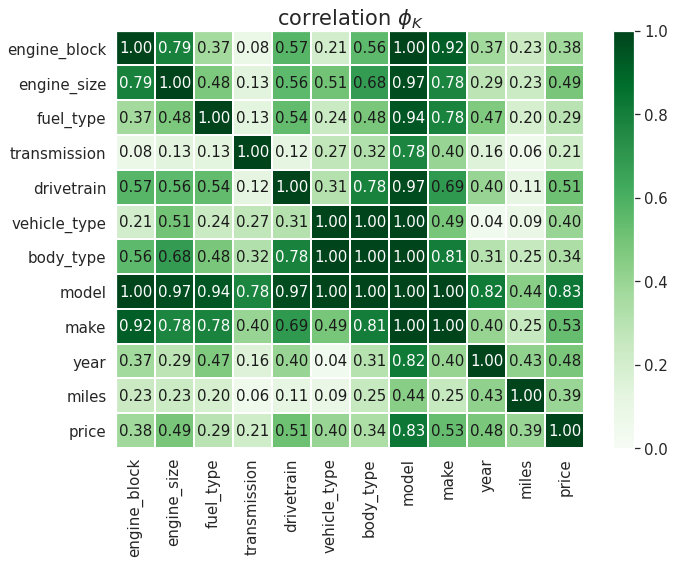

In [62]:
# check correlation using Phi_K Correlation Analyzer 
phik_overview = df_tor.phik_matrix()
plot_correlation_matrix(phik_overview.values, 
                        x_labels=phik_overview.columns, 
                        y_labels=phik_overview.index, 
                        vmin=0, vmax=1, color_map="Greens", 
                        title=r"correlation $\phi_K$", 
                        fontsize_factor=1.5, 
                        figsize=(10, 8))
plt.tight_layout()

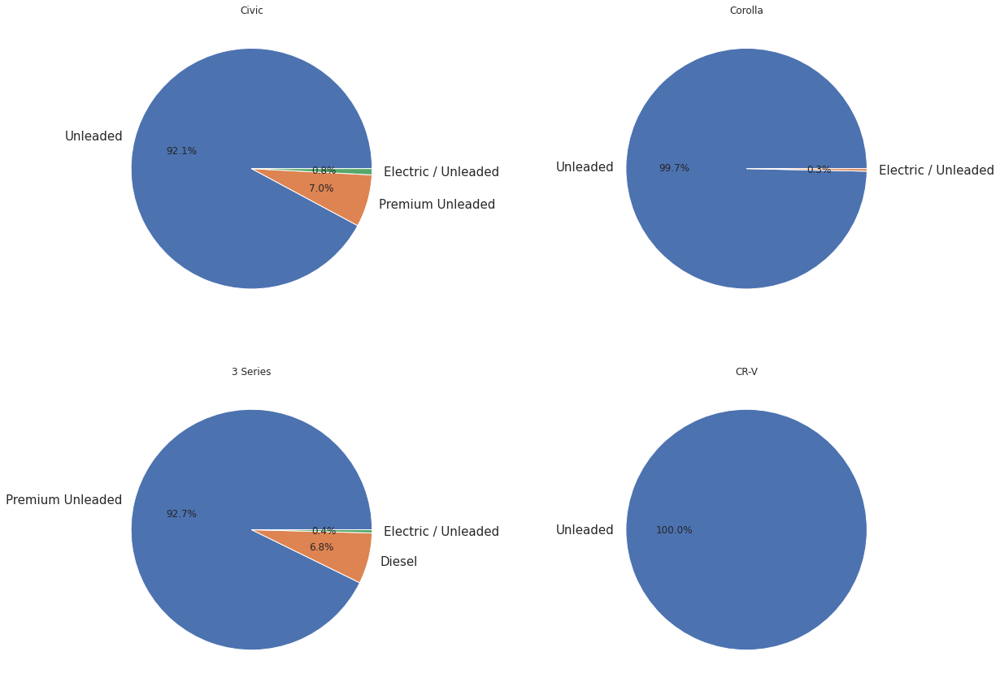

In [63]:
### Fuel_type can be an important feature, instead of simply dropping all the records and also for the purpose of learning, lets try to replace these missing values.
# Phi_K Correlation heatmap indicates that fuel_type has a high correlation with car model
# Pie charts show that these brands prefer to produce cars with certain fuel_type
plt.figure(figsize=(20,15))
plt.subplot(221)
df_tor["fuel_type"][df_tor["model"]=='Civic'].value_counts().plot.pie(autopct = '%.1f%%', title="Civic") 
plt.axis('off')

plt.subplot(222)
df_tor["fuel_type"][df_tor["model"]=='Corolla'].value_counts().plot.pie(autopct = '%.1f%%', title="Corolla")
plt.axis('off')

plt.subplot(223)
df_tor["fuel_type"][df_tor["model"]=='3 Series'].value_counts().plot.pie(autopct = '%.1f%%', title="3 Series")
plt.axis('off')

plt.subplot(224)
df_tor["fuel_type"][df_tor["model"]=='CR-V'].value_counts().plot.pie(autopct = '%.1f%%', title="CR-V")
plt.axis('off')

plt.show()
# model Civic has 92.1% cars with premim unleaded fuel_type
# model Corolla has 99.7% cars with unleaded fuel_type
# model 3 Series has 92.7 % cars with unleaded fuel_type
# model CR-V has 100% with unleaded fuel_type

In [64]:
# The approach used here is to replace missing fuel_type with the most common value for each car model. First, I will create a dataframe with total count of each fuel type by car model,and only keep the highest fuel_type for each model.
fuel_count = df_tor.groupby(['fuel_type','model'], sort=True).size().reset_index(name='Count').sort_values(['model','Count'],ascending=False).groupby(['model']).first()

In [65]:
# Reset the index for 'model to make it accessble for the next step.
fuel_count.reset_index(inplace=True)
fuel_pair = fuel_count[['model','fuel_type']]

In [66]:
# create a panda series for model and its corresponding highest fuel_type
fuel_replace = pd.Series(fuel_pair.fuel_type.values,index = fuel_pair.model)

In [67]:
# Replace the missing fuel_type using the panda series just created. The missing value is replaced by most common value for that brand.
df_tor['fuel_type'] = df_tor['fuel_type'].fillna(df_tor['model'].apply(lambda x: fuel_replace.get(x)))

In [68]:
# dropping the remaining records since they cant be replaced.
df_tor=df_tor.dropna(subset=['fuel_type'])

In [69]:
# Miles
# Replacing missing values in miles with median value of each year. Median is less impacted by extreme values compared to mean. we will first get all the median number by year. 
miles_median = dict(df_tor.groupby('year')['miles'].median())

In [70]:
df_tor['miles'] = df_tor['miles'].fillna(df_tor['year'].apply(lambda x:miles_median.get(x)))

In [71]:
# Removing the left missing values in miles because no information is available for that year.
df_tor=df_tor.dropna(subset=['miles'])

In [72]:
missing_values_count = df_tor.isnull().sum()
missing_values_count

price              0
miles              0
year               0
make               0
model              0
body_type       1091
vehicle_type    1229
drivetrain         0
transmission       0
fuel_type          0
engine_size     1284
engine_block    1296
dtype: int64

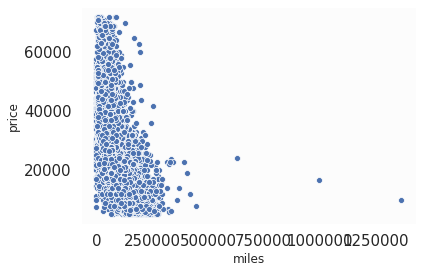

In [73]:
# Lets see if miles has any outliers using scatterplot
ax = sns.scatterplot(x="miles", y="price", data=df_tor)
ax.get_xaxis().get_major_formatter().set_scientific(False)
ax.get_yaxis().get_major_formatter().set_scientific(False)

In [74]:
# From the scatterplot above we can easily see some outliers, let's first only keep cars between 1 miles and 500000 miles.
df_tor=df_tor[(df_tor.miles < 500000) & (df_tor.miles > 1 )]

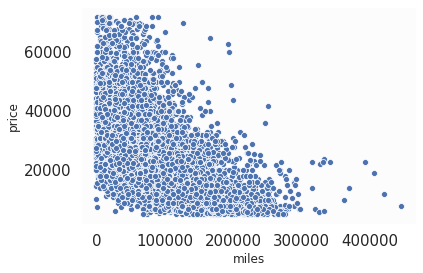

In [75]:
# check the distribution after removing records with miles >1 and < 500000:
ax = sns.scatterplot(x="miles", y="price", data=df_tor)
ax.get_xaxis().get_major_formatter().set_scientific(False)
ax.get_yaxis().get_major_formatter().set_scientific(False)

In [76]:
# There are still several instances where miles > 300000, lets remove those as well
df_tor=df_tor[(df_tor.miles < 300000) & (df_tor.miles > 1 )]

In [77]:
# Body_type
# Phi_K Correlation heatmap indicates that body type has a high correltion with vehicle type, thus, we will replace missing body_type based on vehicle type. Lets take a look at these two attributes by count
df_bt = df_tor.groupby(['vehicle_type','body_type'], sort=True).size().reset_index(name='Count')
df_bt

,vehicle_type,body_type,Count
0,Car,Car Van,1
1,Car,Convertible,78
2,Car,Coupe,277
3,Car,Hatchback,993
4,Car,Micro Car,6
5,Car,Mini Mpv,19
6,Car,SUV,1
7,Car,Sedan,4074
8,Car,Targa,3
9,Car,Wagon,104


In [78]:
# We also find out that there are records missing both attributes
df_tor.loc[(df_tor['vehicle_type'].isna()) & (df_tor['body_type'].isna())].count()

price           1079
miles           1079
year            1079
make            1079
model           1079
body_type          0
vehicle_type       0
drivetrain      1079
transmission    1079
fuel_type       1079
engine_size        0
engine_block       0
dtype: int64

In [79]:
# Lets drop these records because the values cant be replaced by the approach we are using.
df_tor=df_tor.dropna(subset=['vehicle_type','body_type'],how = 'all') # drop records which are missing both vehicle type and body type

In [80]:
missing_values_count = df_tor.isnull().sum()
missing_values_count

price             0
miles             0
year              0
make              0
model             0
body_type        10
vehicle_type    148
drivetrain        0
transmission      0
fuel_type         0
engine_size     203
engine_block    215
dtype: int64

In [81]:
# Replacing missing vehicle type based on most common body_type, first lets check the distribution of each body type for the vehicle type
df_bodytype = df_tor.groupby(['vehicle_type','body_type'], sort=True).size().reset_index(name='Count')
df_bodytype

,vehicle_type,body_type,Count
0,Car,Car Van,1
1,Car,Convertible,78
2,Car,Coupe,277
3,Car,Hatchback,993
4,Car,Micro Car,6
5,Car,Mini Mpv,19
6,Car,SUV,1
7,Car,Sedan,4074
8,Car,Targa,3
9,Car,Wagon,104


In [82]:
# The approach is to replace the missing value with most common body type for each vehicle type
df_tor.loc[(df_tor['vehicle_type'] == 'Car') & (df_tor['body_type'].isna()),'body_type'] = 'Sedan'
df_tor.loc[(df_tor['vehicle_type'] == 'Truck') & (df_tor['body_type'].isna()),'body_type'] = 'SUV'

In [83]:
# Now lets deal with missing vehicle type, similarly we will replace missing vehicle type based on most common body_type, lets first check the distribution of vehicle type for each body type
df_vechile = df_tor.groupby(['body_type','vehicle_type'], sort=True).size().reset_index(name='Count')
df_vechile
# We can see that in most cases, each body_type corresponding to one vehicle type. Some incosistent data points are probably entered by mistake.

,body_type,vehicle_type,Count
0,Car Van,Car,1
1,Car Van,Truck,8
2,Cargo Van,Truck,111
3,Chassis Cab,Truck,10
4,Convertible,Car,78
5,Coupe,Car,277
6,Cutaway,Truck,22
7,Hatchback,Car,993
8,Micro Car,Car,6
9,Mini Mpv,Car,19


In [84]:
# Lets first drop these inconsistent records:
df_tor = df_tor.drop(df_tor[(df_tor['body_type'] == 'Car Van') & (df_tor['vehicle_type'] == 'Car')].index) # car van shouldn't be mapped to car

In [85]:
df_tor = df_tor.drop(df_tor[(df_tor['body_type'] == 'Mini Mpv') & (df_tor['vehicle_type'] == 'Truck')].index) # mini mpv shouldn't be mapped to truck

In [86]:
df_tor = df_tor.drop(df_tor[(df_tor['body_type'] == 'SUV') & (df_tor['vehicle_type'] == 'Car')].index) # SUV shouldnt be mapped to car

In [87]:
# Replacing missing vehicle type based on its body type, first create a new dataframe by body_type with most common vehicle type by count
df_vechile = df_tor.groupby(['body_type','vehicle_type'], sort=True).size().reset_index(name='Count')
df_vechile

,body_type,vehicle_type,Count
0,Car Van,Truck,8
1,Cargo Van,Truck,111
2,Chassis Cab,Truck,10
3,Convertible,Car,78
4,Coupe,Car,277
5,Cutaway,Truck,22
6,Hatchback,Car,993
7,Micro Car,Car,6
8,Mini Mpv,Car,19
9,Minivan,Truck,326


In [88]:
# create a padada series with only bodytype and vehicle type, then replace missing vehicle type based on bodytype in the panda series.
vechile_pair = df_vechile[['body_type','vehicle_type']]

In [89]:
vechile_replace = pd.Series(vechile_pair.vehicle_type.values,index = vechile_pair.body_type)

In [90]:
df_tor['vehicle_type'] = df_tor['vehicle_type'].fillna(df_tor['body_type'].apply(lambda x: vechile_replace.get(x)))

In [91]:
missing_values_count = df_tor.isnull().sum()
missing_values_count

price             0
miles             0
year              0
make              0
model             0
body_type         0
vehicle_type      0
drivetrain        0
transmission      0
fuel_type         0
engine_size     202
engine_block    214
dtype: int64

In [92]:
# After above data cleaning process, I find that the information provided by these two attributes are kind of overlaping with each other. The body type is really a granular level of vehicle type. The decision here is to only keep body_type
df_tor=df_tor.drop(["vehicle_type"],axis=1)

In [93]:
# Engine_block
# Lets first change engine block of all electric cars to 'N/A'
df_tor.loc[df_tor.fuel_type == 'Electric', 'engine_block'] = 'N/A'

In [94]:
# Phi_K Correlation heatmap indicates engine_block is highly correlated with car models. We will replace the missing values with most commonly used engine block type for each car model

In [95]:
# Same coding approach will be used here as previously as to replace missing engine block by most common value by each make/brand.
block_count = df_tor.groupby(['engine_block','model'], sort=True).size().reset_index(name='Count').sort_values(['model','Count'],ascending=False).groupby(['model']).first()

In [96]:
block_count.reset_index(inplace=True)

In [97]:
block_pair = block_count[['model','engine_block']]

In [98]:
block_replace = pd.Series(block_pair.engine_block.values,index = block_pair.model)
df_tor['engine_block'] = df_tor['engine_block'].fillna(df_tor['model'].apply(lambda x: block_replace.get(x)))

In [99]:
missing_values_count = df_tor.isnull().sum()
missing_values_count

price             0
miles             0
year              0
make              0
model             0
body_type         0
drivetrain        0
transmission      0
fuel_type         0
engine_size     202
engine_block      4
dtype: int64

In [100]:
# dropping remaining 4 records since they cant be replaced.
df_tor=df_tor.dropna(subset=['engine_block'])

In [101]:
# Engine_size
# Lets first change engine size of all electric cars to 0
df_tor.loc[df_tor.fuel_type == 'Electric', 'engine_size'] = 0

In [102]:
# Pandas Profiling report indicates engine_size is highly correlated with car models . We will replace the missing values with most commonly used engine size for each car model
size_count = df_tor.groupby(['engine_size','model'], sort=True).size().reset_index(name='Count').sort_values(['model','Count'],ascending=False).groupby(['model']).first()

In [103]:
# Same coding approach is used here as to replace missng engine size based on engine block.
size_count.reset_index(inplace=True)

In [104]:
size_pair = size_count[['model','engine_size']]

In [105]:
size_replace = pd.Series(size_pair.engine_size.values,index = size_pair.model)

In [106]:
df_tor['engine_size'] = df_tor['engine_size'].fillna(df_tor['model'].apply(lambda x: size_replace.get(x)))

In [107]:
missing_values_count = df_tor.isnull().sum()
missing_values_count

price           0
miles           0
year            0
make            0
model           0
body_type       0
drivetrain      0
transmission    0
fuel_type       0
engine_size     0
engine_block    0
dtype: int64

In [108]:
len(df_tor)

11281

In [109]:
df_tor.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 11281 entries, 446 to 393573
Data columns (total 11 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   price         11281 non-null  int64  
 1   miles         11281 non-null  float64
 2   year          11281 non-null  float64
 3   make          11281 non-null  object 
 4   model         11281 non-null  object 
 5   body_type     11281 non-null  object 
 6   drivetrain    11281 non-null  object 
 7   transmission  11281 non-null  object 
 8   fuel_type     11281 non-null  object 
 9   engine_size   11281 non-null  float64
 10  engine_block  11281 non-null  object 
dtypes: float64(3), int64(1), object(7)
memory usage: 1.0+ MB


In [110]:
# check each make by count
df_tor.make.value_counts().to_frame()

,make
Hyundai,1237
Toyota,1125
Volkswagen,889
Honda,827
Ford,780
BMW,747
Mercedes-Benz,687
Nissan,647
Mazda,520
Chevrolet,518


In [111]:
# Some brands have too few samples. For the precision of our models, I choose to remove the car brands which have less than 20 samples. It will narrow the capability of our model, but in return lower the bias and variance.
rm_brands = ['Maserati', 'FIAT', 'Scion', 'smart', 'Pontiac', 'Alfa Romeo', 'Hummer', 'Aston Martin', 'Saab','Suzuki','Tesla']
for brand in rm_brands:
    df_tor = df_tor[~(df_tor['make'] == brand)]

interval columns not set, guessing: ['price', 'miles', 'year', 'engine_size']


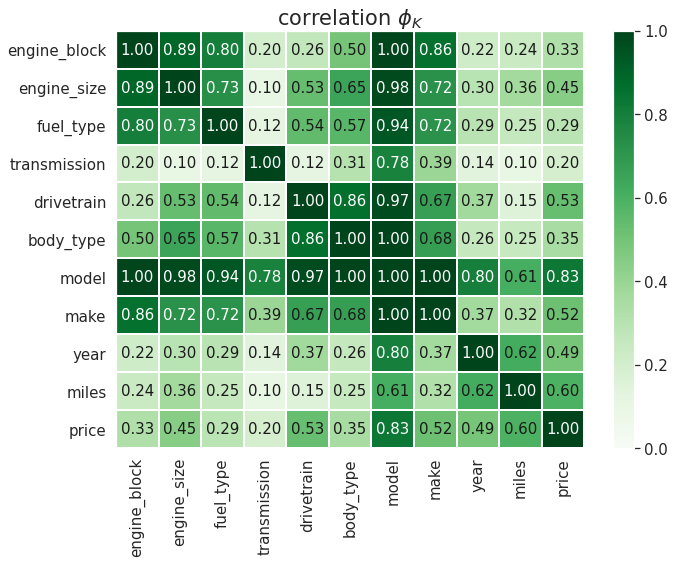

In [112]:
# check correlation using Phi_K Correlation Analyzer after data cleaning
phik_overview = df_tor.phik_matrix()
plot_correlation_matrix(phik_overview.values, 
                        x_labels=phik_overview.columns, 
                        y_labels=phik_overview.index, 
                        vmin=0, vmax=1, color_map="Greens", 
                        title=r"correlation $\phi_K$", 
                        fontsize_factor=1.5, 
                        figsize=(10, 8))
plt.tight_layout()

In [113]:
# check panada profiling after data cleaning
profile1 = pp(df_tor)
profile1.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [114]:
# Save the profile as 'profile_clead_tor'
profile1.to_file("profile_clead_tor.html")

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [115]:
# total number of records after data cleaning
len(df_tor)

11186

In [116]:
# The end of data cleaning and processing for toronto data

In [117]:
# Another dataset is selected for comparison for our reserch purpose. The city selected is Boston, since it is comparable to Toronto. 
# The same data cleaning and processing approach will be applied to the new dataset.

In [118]:
# Load data. since the raw dataset is huge, we need to transform it in a dask dataframe first
df2 = dd.read_csv("us-dealers-used.csv",dtype={'fuel_type': 'object', 'engine_block': 'object','zip': 'object', 'year': 'float64'})

In [119]:
# drop irrelevant columns for this research
drop_column = ['id', 'vin', 'stock_no', 'seller_name','street','zip']
df2 = df2.drop(columns = drop_column)

In [120]:
# onley select city as Boston
df2 =df2[df2.state == "MA"]
df2=df2[df2.city == "Boston"]

In [121]:
# transform dask dataframe into pandas dataframe
df_bs = df2.compute()

In [122]:
# check number of records before data cleaning and processing
len(df_bs)

12780

In [123]:
# drop state, city and trim
df_bs=df_bs.drop(["state","city","trim"],axis=1)

In [124]:
df_bs.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 12780 entries, 141 to 9367
Data columns (total 12 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   price         12664 non-null  float64
 1   miles         12760 non-null  float64
 2   year          12780 non-null  float64
 3   make          12780 non-null  object 
 4   model         12775 non-null  object 
 5   body_type     12761 non-null  object 
 6   vehicle_type  12757 non-null  object 
 7   drivetrain    12772 non-null  object 
 8   transmission  12767 non-null  object 
 9   fuel_type     12749 non-null  object 
 10  engine_size   12655 non-null  float64
 11  engine_block  12629 non-null  object 
dtypes: float64(4), object(8)
memory usage: 1.3+ MB


In [125]:
# Overall, the missing value only account for a very small portion of the whole dataset
missing_values_count = df_bs.isnull().sum()
missing_values_count

price           116
miles            20
year              0
make              0
model             5
body_type        19
vehicle_type     23
drivetrain        8
transmission     13
fuel_type        31
engine_size     125
engine_block    151
dtype: int64

In [126]:
# sample data:
df_bs.head(20)

,price,miles,year,make,model,body_type,vehicle_type,drivetrain,transmission,fuel_type,engine_size,engine_block
141,22998.0,87571.0,2013.0,Mercedes-Benz,CLS-Class,Coupe,Car,4WD,Automatic,Premium Unleaded,4.7,V
512,10998.0,34998.0,2015.0,Chevrolet,Spark,Hatchback,Car,FWD,Automatic,Unleaded,1.2,I
882,58998.0,30819.0,2018.0,Mercedes-Benz,GLS-Class,SUV,Truck,4WD,Automatic,Premium Unleaded,4.7,V
3534,79998.0,10492.0,2019.0,Porsche,Cayenne,SUV,Truck,4WD,Automatic,Premium Unleaded,2.9,V
4772,58498.0,21363.0,2017.0,Mercedes-Benz,GLS-Class,SUV,Truck,4WD,Automatic,Premium Unleaded,4.7,V
5289,58998.0,45391.0,2017.0,Mercedes-Benz,GLE-Class,SUV,Truck,4WD,Automatic,Premium Unleaded,5.5,V
6160,NaN,8.0,2021.0,BMW,8 Series,Sedan,Car,4WD,Automatic,Premium Unleaded,4.4,V
6700,23498.0,58970.0,2017.0,GMC,Savana Cargo,Cargo Van,Truck,RWD,Automatic,Unleaded,4.8,V
8004,53998.0,27262.0,2014.0,BMW,6 Series,Sedan,Car,RWD,Automatic,Premium Unleaded,4.4,V
8339,43900.0,37212.0,2012.0,Porsche,Boxster,Roadster,Car,RWD,Manual,Premium Unleaded,3.4,H


In [127]:
# Lets drop records without prices, since these records will be useless for our analysis
df_bs=df_bs.dropna(subset=['price'])

In [128]:
# check panda profiling for the dataset
profile2 = pp(df_bs)
profile2.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [129]:
# Save the profile as profile_bf_cleaing_bos
profile2.to_file("profile_bf_cleaing_bos.html")

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [130]:
# We will simply drop records with missing values, since they only account for a very small percentage of the whole dataset.
df_bs=df_bs.dropna(subset=['miles','model','body_type','vehicle_type','drivetrain','transmission','fuel_type','engine_size','engine_block'])

In [131]:
missing_values_count = df_bs.isnull().sum()
missing_values_count

price           0
miles           0
year            0
make            0
model           0
body_type       0
vehicle_type    0
drivetrain      0
transmission    0
fuel_type       0
engine_size     0
engine_block    0
dtype: int64

In [132]:
len(df_bs)

12495

In [133]:
# Price:
# Keep the same price range as toronto 
df_bs=df_bs[(df_bs.price < 72321) & (df_bs.price > 4990)]

In [134]:
# Transform price from float to int.
df_bs['price'] = df_bs.price.astype(int)

In [135]:
# Year
# Any car that was made before 1990 should be considered as vintage or classic car. There is a special group of people who colloect these cars,however, these cars should not be inlcuded in this study.
df_bs=df_bs[(df_bs.year > 1990)]

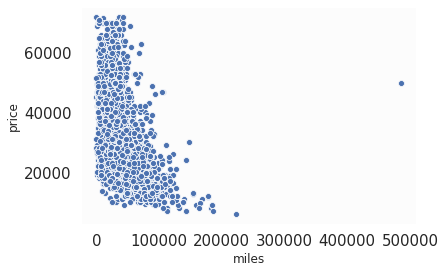

In [136]:
# Miles
# Lets see if miles has any outliers using scatterplot
ax = sns.scatterplot(x="miles", y="price", data=df_bs)
ax.get_xaxis().get_major_formatter().set_scientific(False)
ax.get_yaxis().get_major_formatter().set_scientific(False)

In [137]:
# Remove outliers where miles below 1 and larger than 300000
df_bs=df_bs[(df_bs.miles < 300000) & (df_bs.miles > 1 )]

In [138]:
# Engine_block
# Change engine block of all electric cars to 'N/A'
df_bs.loc[df_bs.fuel_type == 'Electric', 'engine_block'] = 'N/A'

In [139]:
# Engine_size
# Change engine size of all electric cars to 0
df_bs.loc[df_bs.fuel_type == 'Electric', 'engine_size'] = 0

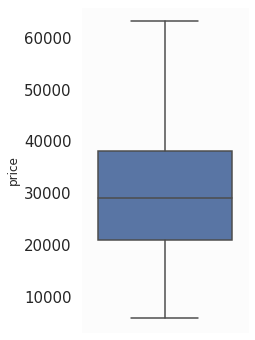

In [140]:
# boxplot for price
plt.figure(figsize=(3,6))
sns.boxplot(y='price', data=df_bs, showfliers=False);

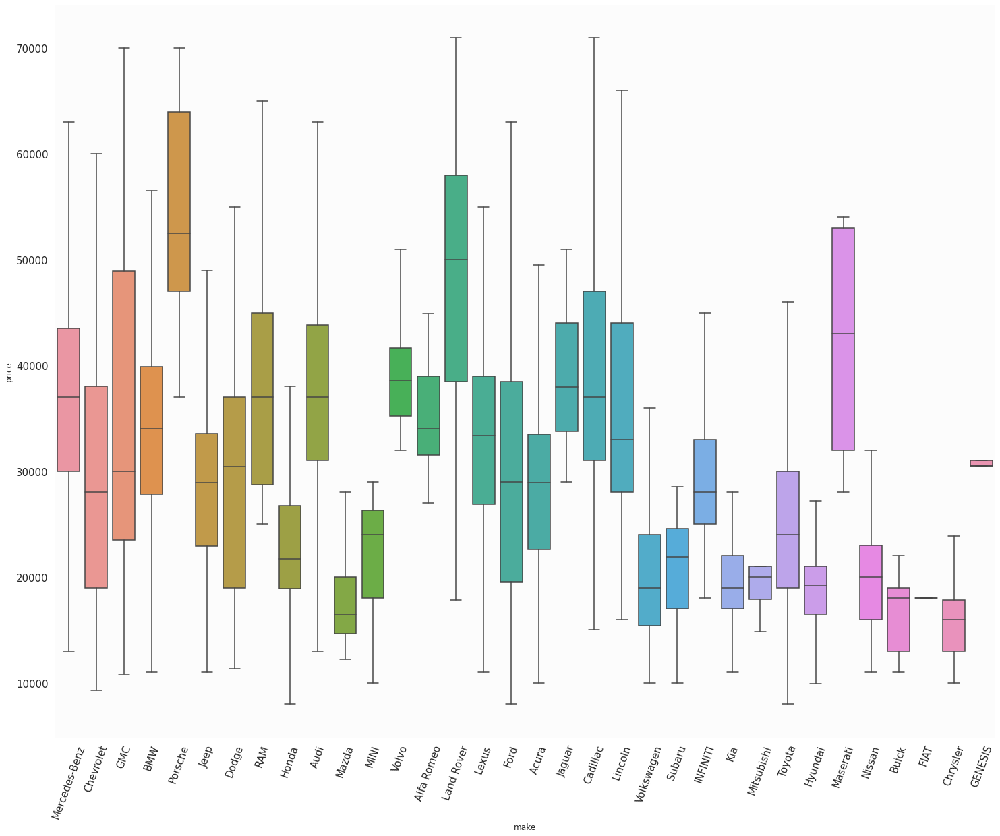

In [141]:
# check price range by brand for Boston:
plt.figure(figsize=(25,20))
plt.xticks(rotation=70)
sns.boxplot(y='price', x='make', data=df_bs, showfliers=False)

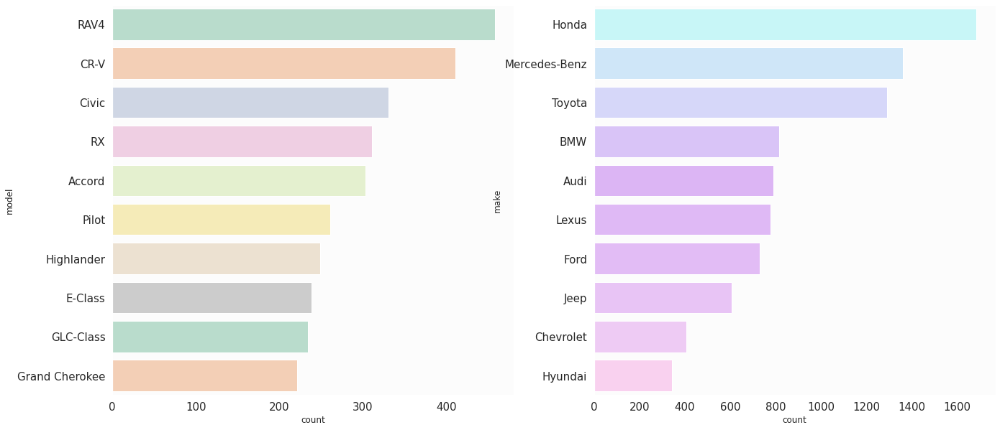

In [142]:
# Top 10 make and model by count for Boston:
colors = ["#C0FDFF", "#C8E7FF","#D0D1FF","#D8BBFF","#DEAAFF","#E2AFFF","#E5B3FE","#ECBCFD","#F3C4FB","#FFCBF2"]
sns.set_palette(sns.color_palette(colors))


fig, ax =plt.subplots(1,2,figsize=(22, 10))
sns.set(rc={"axes.facecolor":"#fcfcfc", "axes.grid":False,'xtick.labelsize':20,'ytick.labelsize':20})
sns.countplot(y ='make',data = df_bs,order=df_bs.make.value_counts().iloc[:10].index, ax = ax[1],palette = colors) 
sns.countplot(y ='model',data = df_bs,order=df_bs.model.value_counts().iloc[:10].index, ax= ax[0],palette = "Pastel2")
fig.show()

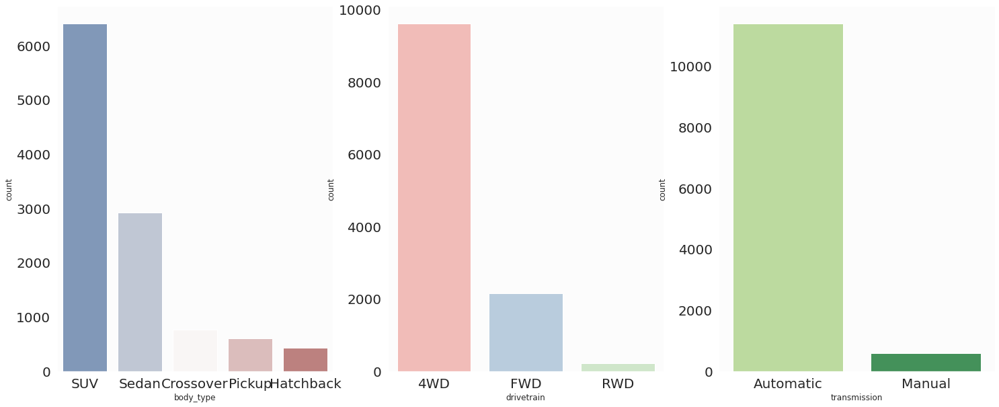

In [143]:
# Top 5 body_type, drivetrain and transmission by count
fig, ax =plt.subplots(1,3,figsize=(25, 10))
sns.set(rc={"axes.facecolor":"#fcfcfc", "axes.grid":False,'xtick.labelsize':15,'ytick.labelsize':15})
sns.countplot(x ='body_type',data = df_bs,order=df_bs.body_type.value_counts().iloc[:5].index, ax = ax[0],palette="vlag")
sns.countplot(x ='drivetrain',data = df_bs,order=df_bs.drivetrain.value_counts().iloc[:5].index, ax = ax[1],palette="Pastel1")
sns.countplot(x ='transmission',data = df_bs,order=df_bs.transmission.value_counts().iloc[:5].index, ax = ax[2],palette="YlGn")
fig.show()

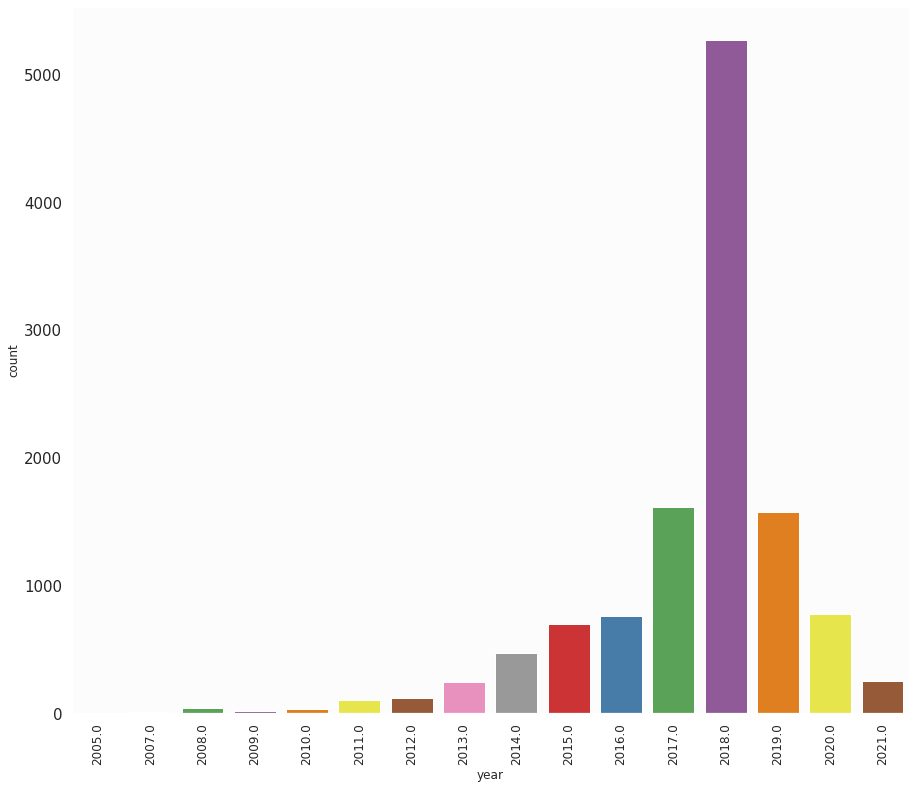

In [144]:
# distribution for year manufactured by count
plt.figure(figsize=(15, 13))
ax = sns.countplot(x = 'year', data=df_bs, palette='Set1')
ax.set_xticklabels(ax.get_xticklabels(), rotation=90,fontsize=12);

In [145]:
# check body_type and vehicle_type, we found some inconsistent data there. 
df_bv = df_bs.groupby(['body_type','vehicle_type'], sort=True).size().reset_index(name='Count')
df_bv
# We can see that in most cases, each body_type corresponding to one vehicle type. Some outliers are probably entered by mistake.

,body_type,vehicle_type,Count
0,Cargo Van,Truck,63
1,Chassis Cab,Truck,10
2,Convertible,Car,60
3,Coupe,Car,441
4,Crossover,Car,9
5,Crossover,Truck,765
6,Hatchback,Car,442
7,Mini Mpv,Truck,7
8,Minivan,Truck,114
9,Passenger Van,Truck,16


In [146]:
# lets drop these records:
df_bs = df_bs.drop(df_bs[(df_bs['body_type'] == 'Crossover') & (df_bs['vehicle_type'] == 'Car')].index) # crossover shouln't be mapped to car
df_bs = df_bs.drop(df_bs[(df_bs['body_type'] == 'SUV') & (df_bs['vehicle_type'] == 'Car')].index) # SUV shouldn't be mppaed to car

In [147]:
# check brand by count:
df_bs.make.value_counts().to_frame()

,make
Honda,1684
Mercedes-Benz,1361
Toyota,1283
BMW,799
Audi,791
Lexus,776
Ford,731
Jeep,606
Chevrolet,407
Hyundai,344


In [148]:
# Remove the car brands which have less than 20 samples. It will narrow the capability of our model, but in return lower the bias and variance.
rm_brands = ['FIAT', 'GENESIS']
for brand in rm_brands:
    df_bs = df_bs[~(df_bs['make'] == brand)]

In [149]:
# Vehicle_type will be dropped for Boston dataset as well
df_bs=df_bs.drop(["vehicle_type"],axis=1)

interval columns not set, guessing: ['price', 'miles', 'year', 'engine_size']


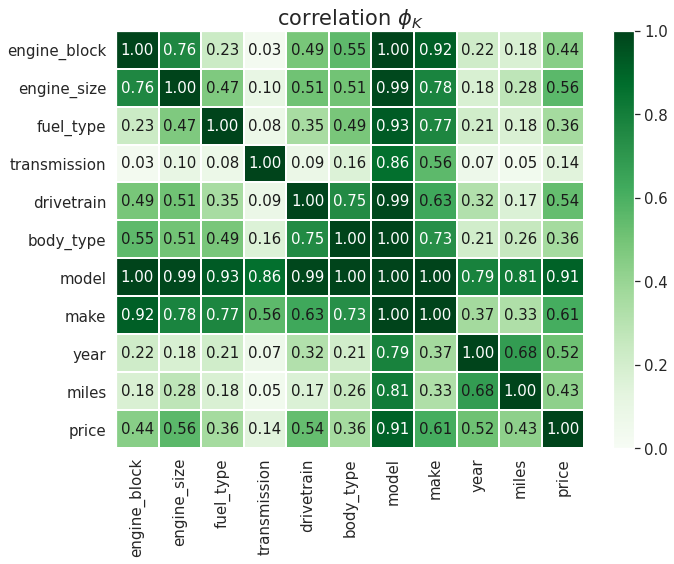

In [150]:
# check correlation using Phi_K Correlation Analyzer after data cleaning
phik_overview = df_bs.phik_matrix()
plot_correlation_matrix(phik_overview.values, 
                        x_labels=phik_overview.columns, 
                        y_labels=phik_overview.index, 
                        vmin=0, vmax=1, color_map="Greens", 
                        title=r"correlation $\phi_K$", 
                        fontsize_factor=1.5, 
                        figsize=(10, 8))
plt.tight_layout()

In [151]:
# check data profiling after data cleaning:
profile3 = pp(df_bs)
profile3.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [152]:
# save the data profile as 'profile_cleaned_bos'
profile2.to_file("profile_cleaned_bos.html")

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [153]:
# total number of Boston dataset after cleaning
len(df_bs)

11969

In [154]:
# feature engineering
# Before we start to train the models, We also need to normalize the values in the numerical features ("year" ,"engine_size" "miles"), as they do not have the same scale. This will help to improve the performence of our models
# The method usded here is MinMaxScaler
# The price is not scaled because it would be easier to interpret on the performance result if we keep it this way
scaler = MinMaxScaler()
num_vars= ['year', 'miles', 'engine_size']
df_tor[num_vars] = scaler.fit_transform(df_tor[num_vars])

In [155]:
# The first model we will implement is Linear Regression, however, linear regression as other regression models can not handle categorical data directly. Thus, we need to apply encoding first.
# Most of our categorical features have more than two values. If we use LabelEncoder then these values will be treated as ordinal ones by the machine learning model. 
# In order to avoid bias, we will select One-hot encoder, also called as dummy encoding, however, model feature has a high cardinality, we need to avoid curse of dimensionality as well
# lets make a copy of cleaned dataset first
df_tor_model = df_tor.copy()

In [156]:
# Upon further checking, a lot of the model only appear once in our dataset! So the approach we use here first is to use rarelabel encoder. All models that appear less than 20 times are labelled as 'Rare' here. 
# Set the threshold first, 20/ 11186 (total record of toronto dataset) = 0.002
rare_encoder = RareLabelCategoricalEncoder(
    tol=0.002,
    n_categories=10, variables=["model"])  

In [157]:
# Implement the encoding on the dataset, this will also help us to reduce the dimensionality of our dataset.
rare_encoder.fit(df_tor_model)

RareLabelEncoder(ignore_format=False, max_n_categories=None, n_categories=10,
                 replace_with='Rare', tol=0.002, variables=['model'])

In [158]:
df_tor_model = rare_encoder.transform(df_tor_model)

In [159]:
# Now we will apply dummy encoding on the dataset
# First, Define a function to generate dummy variables and merge it with data frame
def dummies(x,df):
    temp = pd.get_dummies(df[[x]], drop_first=True)
    df = pd.concat([df,temp], axis=1)
    df.drop([x], axis=1, inplace=True)
    return df

# Apply function to the dataset
df_tor_model = dummies('make', df_tor_model)
df_tor_model = dummies('model', df_tor_model)
df_tor_model = dummies('drivetrain', df_tor_model)
df_tor_model = dummies('transmission', df_tor_model)
df_tor_model = dummies('fuel_type', df_tor_model)
df_tor_model = dummies('body_type', df_tor_model)
df_tor_model = dummies('engine_block', df_tor_model)

In [160]:
# check some sample data
df_tor_model.head()

,price,miles,year,engine_size,make_Audi,make_BMW,make_Buick,make_Cadillac,make_Chevrolet,make_Chrysler,...,body_type_Minivan,body_type_Passenger Van,body_type_Pickup,body_type_SUV,body_type_Sedan,body_type_Targa,body_type_Wagon,engine_block_I,engine_block_N/A,engine_block_V
446,39455,0.293181,0.869565,0.684932,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,1
732,6450,0.742471,0.391304,0.739726,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,1
992,24962,0.178778,0.869565,0.205479,0,0,0,0,1,0,...,0,0,0,0,0,0,0,1,0,0
993,24962,0.173431,0.869565,0.205479,0,0,0,0,1,0,...,0,0,0,0,0,0,0,1,0,0
996,24962,0.173431,0.869565,0.205479,0,0,0,0,1,0,...,0,0,0,0,0,0,0,1,0,0


In [161]:
# Split train and test data for model implemetation using 8:2 ratio:
X_train, X_test, Y_train, Y_test = train_test_split(df_tor_model.drop('price',axis=1), df_tor_model['price'], test_size=0.20, random_state=141)

In [162]:
# build model evaluation dataframe for later use.
model_evaluation  = pd.DataFrame(columns=('r2', 'rmse','mae' ))

In [163]:
# Using linear regression algorithm on the tranning set
lrm = LinearRegression()
lrm.fit(X_train,Y_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [164]:
# performance evaluation, the measurement used here are r square, RMSE and MAE
# measure the performance on testing dataset
lrm_predict = lrm.predict(X_test)

lrm_r2 = metrics.r2_score(Y_test, lrm_predict)
lrm_rmse = math.sqrt(metrics.mean_squared_error(Y_test, lrm_predict))
lrm_mae = metrics.mean_absolute_error(Y_test, lrm_predict)

model_evaluation = model_evaluation.append(pd.DataFrame({'r2':[lrm_r2], 'rmse':[lrm_rmse], 'mae':[lrm_mae]}, index = ['Linear Regression Toronto']))

print('For the linear regressor, the root mean square error for the testing set is:', lrm_rmse)
print('The r2 score for the testing set is:', lrm_r2)
print('The mae for the testing set is:', lrm_mae)

For the linear regressor, the root mean square error for the testing set is: 5067.514807859321
The r2 score for the testing set is: 0.8198440976466574
The mae for the testing set is: 3647.3118170148527


In [165]:
# To test whether it is overfitting, we apply the model on trainning dataset as well and compare the socres:
lrm_predict_train = lrm.predict(X_train)

lrm_r2_train = metrics.r2_score(Y_train, lrm_predict_train)
lrm_rmse_train = math.sqrt(metrics.mean_squared_error(Y_train, lrm_predict_train))
lrm_mae_train = metrics.mean_absolute_error(Y_train, lrm_predict_train)


print('For the linear regressor, the root mean square error for the training set is:', lrm_rmse_train)
print('The r2 score for the training set is:', lrm_r2_train)
print('The mae for the training set is:', lrm_mae_train)
# With somewhat similiar results, it seems that overfitting is not a probelm.

For the linear regressor, the root mean square error for the training set is: 4897.770432892777
The r2 score for the training set is: 0.8398875751860665
The mae for the training set is: 3494.133494564074


In [166]:
# We will apply linear regression on Boston dataset as well and compare the differences
# First we will scale the numberic values as we did for Toronto dataset 
scaler = MinMaxScaler()
num_vars= ['year', 'miles', 'engine_size']
df_bs[num_vars] = scaler.fit_transform(df_bs[num_vars])

In [167]:
# copy the Boston dataset
df_bs_model = df_bs.copy()

In [168]:
# All models that appear less than 20 times are labelled as 'Rare' here. 
# Set the threshold first, 20/total record of boston dataset = 0.0017
rare_encoder = RareLabelCategoricalEncoder(
    tol=0.002,
    n_categories=10, variables=["model"])  

In [169]:
# Apply rare encoder on the dataset
rare_encoder.fit(df_bs_model)

RareLabelEncoder(ignore_format=False, max_n_categories=None, n_categories=10,
                 replace_with='Rare', tol=0.002, variables=['model'])

In [170]:
df_bs_model = rare_encoder.transform(df_bs_model)

In [171]:
# create a function to generate dummy variables and merge it with data frame
def dummies(x,df):
    temp = pd.get_dummies(df[[x]], drop_first=True)
    df = pd.concat([df,temp], axis=1)
    df.drop([x], axis=1, inplace=True)
    return df

# Apply function to the cars_new df
df_bs_model = dummies('make', df_bs_model)
df_bs_model = dummies('model', df_bs_model)
df_bs_model = dummies('drivetrain', df_bs_model)
df_bs_model = dummies('transmission', df_bs_model)
df_bs_model = dummies('fuel_type', df_bs_model)
df_bs_model = dummies('body_type', df_bs_model)
df_bs_model = dummies('engine_block', df_bs_model)

In [172]:
# check some sample data after encoding:
df_bs_model.head()

,price,miles,year,engine_size,make_Alfa Romeo,make_Audi,make_BMW,make_Buick,make_Cadillac,make_Chevrolet,...,body_type_Mini Mpv,body_type_Minivan,body_type_Passenger Van,body_type_Pickup,body_type_Roadster,body_type_SUV,body_type_Sedan,body_type_Wagon,engine_block_I,engine_block_V
141,22998,0.394358,0.5000,0.672131,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
512,10998,0.157576,0.6250,0.098361,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,1,0
882,58998,0.138755,0.8125,0.672131,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,1
4772,58498,0.096166,0.7500,0.672131,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,1
5289,58998,0.204385,0.7500,0.803279,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,1


In [173]:
# Split train and test data using 8:2 ratio:
x_train, x_test, y_train, y_test = train_test_split(df_bs_model.drop('price',axis=1), df_bs_model['price'], test_size=0.20, random_state=141)

In [174]:
# Apply linear regression model
lrm2 = LinearRegression()
lrm2.fit(x_train,y_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [175]:
# measure the performance on testing dataset
# The result is better than Toronto dataset
lrm2_predict = lrm2.predict(x_test)

lrm2_r2 = metrics.r2_score(y_test, lrm2_predict)
lrm2_rmse = math.sqrt(metrics.mean_squared_error(y_test, lrm2_predict))
lrm2_mae = metrics.mean_absolute_error(y_test, lrm2_predict)

model_evaluation = model_evaluation.append(pd.DataFrame({'r2':[lrm2_r2], 'rmse':[lrm2_rmse],'mae':[lrm2_mae]}, index = ['Linear Regression Boston']))

print('For the linear regressor, the root mean square error for the testing set is:', lrm2_rmse)
print('The r2 score for the testing set is:', lrm2_r2)
print('The mae score for the testing set is:', lrm2_mae)

For the linear regressor, the root mean square error for the testing set is: 4634.348636185853
The r2 score for the testing set is: 0.8621068736923854
The mae score for the testing set is: 3348.0899784919793


In [176]:
# Again, to test whether it is overfitting, we calculate the score for the training set as well:
lrm2_predict_train = lrm2.predict(x_train)

lrm2_r2_train = metrics.r2_score(y_train, lrm2_predict_train)
lrm2_rmse_train = math.sqrt(metrics.mean_squared_error(y_train, lrm2_predict_train))
lrm2_mae_train = metrics.mean_absolute_error(y_train, lrm2_predict_train)

print('For the linear regressor, the root mean square error for the training set is:', lrm2_rmse_train)
print('The r2 score for the training set is:', lrm2_r2_train)
print('The mae score for the trainin set is:', lrm2_mae_train)
# With similar scores, it seems that overfitting is not a probelm.

For the linear regressor, the root mean square error for the training set is: 4591.121286043685
The r2 score for the training set is: 0.8618153488281346
The mae score for the trainin set is: 3271.925645638851


In [177]:
# Next we will apply more advanced methods on these two datasets: Random Forest and XGBoost

In [178]:
# We will use the traning and testing dataset prepared in the previous stage
# For Toronto dataset:
rfr = RandomForestRegressor()

In [179]:
# Randomized Search CV, there are a lot of parameters to tune, we only select 5 most important ones here:
from sklearn.model_selection import RandomizedSearchCV
n_estimators=[100,200,300,400,500,600,700,800,900,1000,1100,1200] 
max_features=['auto','sqrt']
max_depth=[5,10,15,20,25,30]
min_samples_split=[2,5,10,15,100]
min_samples_leaf=[1,2,5,10,12]

In [180]:
# creating random grid for later use
random_grid={'n_estimators': n_estimators,'max_features': max_features,
            'max_depth': max_depth,'min_samples_split': min_samples_split,
            'min_samples_leaf': min_samples_leaf}
print(random_grid)

{'n_estimators': [100, 200, 300, 400, 500, 600, 700, 800, 900, 1000, 1100, 1200], 'max_features': ['auto', 'sqrt'], 'max_depth': [5, 10, 15, 20, 25, 30], 'min_samples_split': [2, 5, 10, 15, 100], 'min_samples_leaf': [1, 2, 5, 10, 12]}


In [181]:
# Use the random grid to search for best hyperparameters
# Random search of parameters, using 5 fold cross validation, number of iteration is 10.
rfr_tor = RandomizedSearchCV(estimator = rfr, param_distributions = random_grid, n_iter = 10, cv = 5, random_state=14, n_jobs = 1)

In [182]:
rfr_tor.fit(X_train,Y_train)

RandomizedSearchCV(cv=5, error_score=nan,
                   estimator=RandomForestRegressor(bootstrap=True,
                                                   ccp_alpha=0.0,
                                                   criterion='mse',
                                                   max_depth=None,
                                                   max_features='auto',
                                                   max_leaf_nodes=None,
                                                   max_samples=None,
                                                   min_impurity_decrease=0.0,
                                                   min_impurity_split=None,
                                                   min_samples_leaf=1,
                                                   min_samples_split=2,
                                                   min_weight_fraction_leaf=0.0,
                                                   n_estimators=100,
                              

In [183]:
# Best parameters combination after tuning:
rfr_tor.best_params_

{'n_estimators': 500,
 'min_samples_split': 5,
 'min_samples_leaf': 1,
 'max_features': 'sqrt',
 'max_depth': 25}

In [184]:
# Best estimators:
rfr_tor.best_estimator_

RandomForestRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse',
                      max_depth=25, max_features='sqrt', max_leaf_nodes=None,
                      max_samples=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=5, min_weight_fraction_leaf=0.0,
                      n_estimators=500, n_jobs=None, oob_score=False,
                      random_state=None, verbose=0, warm_start=False)

In [185]:
# Re-train the model using the best estimators from previous result
rfr_tor_be = RandomForestRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse',
                      max_depth=25, max_features='sqrt', max_leaf_nodes=None,
                      max_samples=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=5, min_weight_fraction_leaf=0.0,
                      n_estimators=500, n_jobs=None, oob_score=False,
                      random_state=None, verbose=0, warm_start=False)

In [186]:
rfr_tor_be.fit(X_train,Y_train)

RandomForestRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse',
                      max_depth=25, max_features='sqrt', max_leaf_nodes=None,
                      max_samples=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=5, min_weight_fraction_leaf=0.0,
                      n_estimators=500, n_jobs=None, oob_score=False,
                      random_state=None, verbose=0, warm_start=False)

In [187]:
# evaluate the precting result on the testing dataset:
rfr_tor_predict = rfr_tor_be.predict(X_test)

rfr_tor_r2 = metrics.r2_score(Y_test, rfr_tor_predict)
rfr_tor_rmse = math.sqrt(metrics.mean_squared_error(Y_test, rfr_tor_predict))
rfr_tor_mae = metrics.mean_absolute_error(Y_test, rfr_tor_predict)

model_evaluation = model_evaluation.append(pd.DataFrame({'r2':[rfr_tor_r2], 'rmse':[rfr_tor_rmse],'mae':[rfr_tor_mae]}, index = ['Random Forest Toronto']))

print('For the random forest, the root mean square error for the testing set is:', rfr_tor_rmse)
print('The r2 score for the testing set is:', rfr_tor_r2)
print('The mae score for the testing set is:', rfr_tor_mae)

For the random forest, the root mean square error for the testing set is: 3419.84214471145
The r2 score for the testing set is: 0.9179515157179154
The mae score for the testing set is: 2274.2650320404096


In [188]:
# Lets check the top 5 feature by importances:
rfr_tor_be.feature_importances_

temp2 =df_tor_model.drop(columns=['price'])
feature_rank = pd.DataFrame(rfr_tor_be.feature_importances_,temp2.columns,columns=['importances']).sort_values(['importances'],ascending=False)
feature_rank.head(5)

,importances
year,0.221972
miles,0.209709
drivetrain_FWD,0.088269
engine_size,0.087559
engine_block_V,0.029811


In [189]:
# To test whether it is overfitting, again we calculate the score for the training set as well:
rfr_tor_predict_train = rfr_tor.predict(X_train)

rfr_tor_r2_train = metrics.r2_score(Y_train, rfr_tor_predict_train)
rfr_tor_rmse_train = math.sqrt(metrics.mean_squared_error(Y_train, rfr_tor_predict_train))
rfr_tor_mae_train = metrics.mean_absolute_error(Y_train, rfr_tor_predict_train)

print('For the random forest, the root mean square error for the training set is:', rfr_tor_rmse_train)
print('The r2 score for the trainging set is:', rfr_tor_r2_train)
print('The r2 score for the training set is:', rfr_tor_mae_train)
# There is a very slight overfitting problem based on the r2 score and rmse

For the random forest, the root mean square error for the training set is: 2429.4296420888436
The r2 score for the trainging set is: 0.9606053871579714
The r2 score for the training set is: 1609.1813094180486


In [190]:
# For Boston dataset, the approach will be the same
# Use the random grid to search for best hyperparameters
# Random search of parameters, using 5 fold cross validation,
rfr_bs = RandomizedSearchCV(estimator = rfr, param_distributions = random_grid, n_iter = 10, cv = 5, random_state=14, n_jobs = 1)

In [191]:
# Search for the best parameters
rfr_bs.fit(x_train,y_train)

RandomizedSearchCV(cv=5, error_score=nan,
                   estimator=RandomForestRegressor(bootstrap=True,
                                                   ccp_alpha=0.0,
                                                   criterion='mse',
                                                   max_depth=None,
                                                   max_features='auto',
                                                   max_leaf_nodes=None,
                                                   max_samples=None,
                                                   min_impurity_decrease=0.0,
                                                   min_impurity_split=None,
                                                   min_samples_leaf=1,
                                                   min_samples_split=2,
                                                   min_weight_fraction_leaf=0.0,
                                                   n_estimators=100,
                              

In [192]:
# Best parameters for Boston dataset:
rfr_bs.best_params_

{'n_estimators': 500,
 'min_samples_split': 5,
 'min_samples_leaf': 1,
 'max_features': 'sqrt',
 'max_depth': 25}

In [193]:
# Best estimators:
rfr_bs.best_estimator_

RandomForestRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse',
                      max_depth=25, max_features='sqrt', max_leaf_nodes=None,
                      max_samples=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=5, min_weight_fraction_leaf=0.0,
                      n_estimators=500, n_jobs=None, oob_score=False,
                      random_state=None, verbose=0, warm_start=False)

In [194]:
rfr_bs = RandomForestRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse',
                      max_depth=25, max_features='sqrt', max_leaf_nodes=None,
                      max_samples=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=5, min_weight_fraction_leaf=0.0,
                      n_estimators=500, n_jobs=None, oob_score=False,
                      random_state=None, verbose=0, warm_start=False)

In [195]:
rfr_bs.fit(x_train,y_train)

RandomForestRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse',
                      max_depth=25, max_features='sqrt', max_leaf_nodes=None,
                      max_samples=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=5, min_weight_fraction_leaf=0.0,
                      n_estimators=500, n_jobs=None, oob_score=False,
                      random_state=None, verbose=0, warm_start=False)

In [196]:
# evaluate the prediction result on Boston dataset:
rfr_bs_predict = rfr_bs.predict(x_test)

rfr_bs_r2 = metrics.r2_score(y_test, rfr_bs_predict)
rfr_bs_rmse = math.sqrt(metrics.mean_squared_error(y_test, rfr_bs_predict))
rfr_bs_mae = metrics.mean_absolute_error(y_test, rfr_bs_predict)

model_evaluation = model_evaluation.append(pd.DataFrame({'r2':[rfr_bs_r2], 'rmse':[rfr_bs_rmse],'mae':[rfr_bs_mae]}, index = ['Random Forest Boston']))

print('For the random forest, the root mean square error for the testing set is:', rfr_bs_rmse)
print('The r2 score for the testing set is:', rfr_bs_r2)
print('The mae score for the testing set is:', rfr_bs_mae)

For the random forest, the root mean square error for the testing set is: 1682.7312997289766
The r2 score for the testing set is: 0.9818199631305511
The mae score for the testing set is: 1094.435580137958


In [197]:
# Lets check the top 5 feature by importances:
rfr_bs.feature_importances_

temp3 =df_bs_model.drop(columns=['price'])
feature_rank_bs = pd.DataFrame(rfr_bs.feature_importances_,temp3.columns,columns=['importances']).sort_values(['importances'],ascending=False)
feature_rank_bs.head(5)

,importances
miles,0.144425
year,0.138921
engine_size,0.117500
drivetrain_FWD,0.062034
fuel_type_Premium Unleaded,0.059921


In [198]:
# apply the model on the trainning dataset to see if its overfitting:
rfr_bs_predict_train = rfr_bs.predict(x_train)

rfr_bs_r2_train = metrics.r2_score(y_train, rfr_bs_predict_train)
rfr_bs_rmse_train = math.sqrt(metrics.mean_squared_error(y_train, rfr_bs_predict_train))
rfr_bs_mae_train = metrics.mean_absolute_error(y_train, rfr_bs_predict_train)

print('For the random forest, the root mean square error for the training set is:', rfr_bs_rmse_train)
print('The r2 score for the training set is:', rfr_bs_r2_train)
print('The mae score for the training set is:', rfr_bs_mae_train)

# The score is slightly better than test dataset.

For the random forest, the root mean square error for the training set is: 1270.905470638837
The r2 score for the training set is: 0.9894111505651663
The mae score for the training set is: 862.15143511153


In [199]:
# Next, lets apply XGBoost:
model_xgb = xgb.XGBRegressor()

In [200]:
# For XGboost, we will use hyperparameter tunning as well. There are a lot of parameters to tune, only the most important ones are selected here:
n_estimators = [100,200,300]
max_depth = [10,20,30]
learning_rate=[0.05,0.1,0.15]
min_child_weight=[1,3,5]

In [201]:
# create parameter_grid for later use in RandomizedSearchCV :
parameter_grid = {
    'n_estimators': n_estimators,
    'max_depth':max_depth,
    'learning_rate':learning_rate,
    'min_child_weight':min_child_weight,
    }

In [202]:
# Set up the grid search with 5-fold cross validation, the number of iteration is 10
xgb_tor = RandomizedSearchCV(estimator=model_xgb,
            param_distributions=parameter_grid,
            cv=5,
            n_jobs = 1,
            n_iter= 10,                 
            random_state=14)

In [203]:
# Search for the best parameters
xgb_tor.fit(X_train, Y_train)

RandomizedSearchCV(cv=5, error_score=nan,
                   estimator=XGBRegressor(base_score=None, booster=None,
                                          colsample_bylevel=None,
                                          colsample_bynode=None,
                                          colsample_bytree=None,
                                          enable_categorical=False, gamma=None,
                                          gpu_id=None, importance_type=None,
                                          interaction_constraints=None,
                                          learning_rate=None,
                                          max_delta_step=None, max_depth=None,
                                          min_child_weight=None, missing=nan,
                                          monot...
                                          scale_pos_weight=None, subsample=None,
                                          tree_method=None,
                                          validat

In [204]:
# Best parameters for Boston dataset:
xgb_tor.best_params_

{'n_estimators': 300,
 'min_child_weight': 1,
 'max_depth': 10,
 'learning_rate': 0.1}

In [205]:
# Best estimators:
xgb_tor.best_estimator_

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, enable_categorical=False,
             gamma=0, gpu_id=-1, importance_type=None,
             interaction_constraints='', learning_rate=0.1, max_delta_step=0,
             max_depth=10, min_child_weight=1, missing=nan,
             monotone_constraints='()', n_estimators=300, n_jobs=8,
             num_parallel_tree=1, objective='reg:squarederror',
             predictor='auto', random_state=0, reg_alpha=0, reg_lambda=1,
             scale_pos_weight=1, subsample=1, tree_method='exact',
             validate_parameters=1, verbosity=None)

In [206]:
xgb_tor = xgb.XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, enable_categorical=False,
             gamma=0, gpu_id=-1, importance_type=None,
             interaction_constraints='', learning_rate=0.1, max_delta_step=0,
             max_depth=10, min_child_weight=1, missing=np.nan,
             monotone_constraints='()', n_estimators=300, n_jobs=8,
             num_parallel_tree=1, objective='reg:squarederror',
             predictor='auto', random_state=0, reg_alpha=0, reg_lambda=1,
             scale_pos_weight=1, subsample=1, tree_method='exact',
             validate_parameters=1, verbosity=None)

In [207]:
# train the model with best parameters
xgb_tor.fit(X_train, Y_train)

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, enable_categorical=False,
             gamma=0, gpu_id=-1, importance_type=None,
             interaction_constraints='', learning_rate=0.1, max_delta_step=0,
             max_depth=10, min_child_weight=1, missing=nan,
             monotone_constraints='()', n_estimators=300, n_jobs=8,
             num_parallel_tree=1, objective='reg:squarederror',
             predictor='auto', random_state=0, reg_alpha=0, reg_lambda=1,
             scale_pos_weight=1, subsample=1, tree_method='exact',
             validate_parameters=1, verbosity=None)

In [208]:
# evaluate the prediction result on the testing dataset:
xgb_tor_predict = xgb_tor.predict(X_test)

xgb_tor_r2 = metrics.r2_score(Y_test, xgb_tor_predict)
xgb_tor_rmse = math.sqrt(metrics.mean_squared_error(Y_test, xgb_tor_predict))
xgb_tor_mae = metrics.mean_absolute_error(Y_test, xgb_tor_predict)

model_evaluation = model_evaluation.append(pd.DataFrame({'r2':[xgb_tor_r2], 'rmse':[xgb_tor_rmse],'mae':[xgb_tor_mae]}, index = ['XGB_Toronto']))

print('For the xgb, the root mean square error for the testing set is:', xgb_tor_rmse)
print('The r2 score for the testing set is:', xgb_tor_r2) 
print('The ame score for the testing set is:', xgb_tor_mae) 

For the xgb, the root mean square error for the testing set is: 3171.866588155776
The r2 score for the testing set is: 0.9294189253145879
The ame score for the testing set is: 1994.8169222397928


In [209]:
# Lets check the top 10 feature by importances type 'total_gain':
tor_score = xgb_tor.get_booster().get_score(importance_type='total_gain')
tor_score_list = list(tor_score.items())
tor_fe_score = pd.DataFrame(tor_score_list,columns = ['feature','score'] ).sort_values(['score'],ascending=False)
tor_fe_score['score'] = tor_fe_score['score'].astype(int)
tor_fe_score.head(10)

,feature,score
143,drivetrain_FWD,1699787833344
0,miles,1663765839872
1,year,1195905253376
2,engine_size,966477676544
156,fuel_type_Unleaded,180427751424
171,engine_block_I,104526159872
19,make_Land Rover,44506972160
27,make_Porsche,42090418176
24,make_Mercedes-Benz,29995022336
168,body_type_Sedan,29613146112


In [210]:
# apply the model on the trainning dataset to check overfitting:
xgb_tor_predict_train = xgb_tor.predict(X_train)

xgb_tor_r2_train = metrics.r2_score(Y_train, xgb_tor_predict_train)
xgb_tor_rmse_train = math.sqrt(metrics.mean_squared_error(Y_train, xgb_tor_predict_train))
xgb_tor_mae_train = metrics.mean_absolute_error(Y_train, xgb_tor_predict_train)

print('For the random forest, the root mean square error for the training set is:', xgb_tor_rmse_train)
print('The r2 score for the training set is:', xgb_tor_r2_train)
print('The ame score for the training set is:', xgb_tor_mae_train) 

For the random forest, the root mean square error for the training set is: 1255.6350128213571
The r2 score for the training set is: 0.9894766256699343
The ame score for the training set is: 820.0267756892252


In [211]:
# For Boston dataset, the approach will be the same
# Use the random grid to search for best hyperparameters
# Random search of parameters, using 5 fold cross validation,
# Set up the grid search with 5-fold cross validation
xgb_bs = RandomizedSearchCV(estimator=model_xgb,
            param_distributions=parameter_grid,
            cv=5,
            n_jobs = 1,
            n_iter= 10,                 
            random_state=14)

In [212]:
# Search for the best parameters
xgb_bs.fit(x_train, y_train)

RandomizedSearchCV(cv=5, error_score=nan,
                   estimator=XGBRegressor(base_score=None, booster=None,
                                          colsample_bylevel=None,
                                          colsample_bynode=None,
                                          colsample_bytree=None,
                                          enable_categorical=False, gamma=None,
                                          gpu_id=None, importance_type=None,
                                          interaction_constraints=None,
                                          learning_rate=None,
                                          max_delta_step=None, max_depth=None,
                                          min_child_weight=None, missing=nan,
                                          monot...
                                          scale_pos_weight=None, subsample=None,
                                          tree_method=None,
                                          validat

In [213]:
# Best estimators:
xgb_bs.best_estimator_

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, enable_categorical=False,
             gamma=0, gpu_id=-1, importance_type=None,
             interaction_constraints='', learning_rate=0.1, max_delta_step=0,
             max_depth=30, min_child_weight=3, missing=nan,
             monotone_constraints='()', n_estimators=200, n_jobs=8,
             num_parallel_tree=1, objective='reg:squarederror',
             predictor='auto', random_state=0, reg_alpha=0, reg_lambda=1,
             scale_pos_weight=1, subsample=1, tree_method='exact',
             validate_parameters=1, verbosity=None)

In [214]:
xgb_bs = xgb.XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, enable_categorical=False,
             gamma=0, gpu_id=-1, importance_type=None,
             interaction_constraints='', learning_rate=0.1, max_delta_step=0,
             max_depth=20, min_child_weight=3, missing=np.nan,
             monotone_constraints='()', n_estimators=200, n_jobs=8,
             num_parallel_tree=1, objective='reg:squarederror',
             predictor='auto', random_state=0, reg_alpha=0, reg_lambda=1,
             scale_pos_weight=1, subsample=1, tree_method='exact',
             validate_parameters=1, verbosity=None)

In [215]:
xgb_bs.fit(x_train, y_train)

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, enable_categorical=False,
             gamma=0, gpu_id=-1, importance_type=None,
             interaction_constraints='', learning_rate=0.1, max_delta_step=0,
             max_depth=20, min_child_weight=3, missing=nan,
             monotone_constraints='()', n_estimators=200, n_jobs=8,
             num_parallel_tree=1, objective='reg:squarederror',
             predictor='auto', random_state=0, reg_alpha=0, reg_lambda=1,
             scale_pos_weight=1, subsample=1, tree_method='exact',
             validate_parameters=1, verbosity=None)

In [216]:
# evaluate the prediction result on the testing dataset:
xgb_bs_predict = xgb_bs.predict(x_test)

model_evaluation_xgb  = pd.DataFrame(columns=('r2', 'rmse'))

xgb_bs_r2 = metrics.r2_score(y_test, xgb_bs_predict)
xgb_bs_rmse = math.sqrt(metrics.mean_squared_error(y_test, xgb_bs_predict))
xgb_bs_mae = metrics.mean_absolute_error(y_test, xgb_bs_predict)

model_evaluation = model_evaluation.append(pd.DataFrame({'r2':[xgb_bs_r2], 'rmse':[xgb_bs_rmse],'mae':[xgb_bs_mae]}, index = ['XGB_Boston']))

print('For the xgb, the root mean square error for the testing set is:', xgb_bs_rmse)
print('The r2 score for the testing set is:', xgb_bs_r2) 
print('The mae score for the testing set is:', xgb_bs_mae) 

For the xgb, the root mean square error for the testing set is: 874.0396789971427
The r2 score for the testing set is: 0.9950951298836093
The mae score for the testing set is: 222.6755883034409


In [223]:
bs_score = xgb_bs.get_booster().get_score(importance_type='total_gain')
bs_score_list= list(bs_score.items())
bs_fe_score = pd.DataFrame(bs_score_list,columns = ['feature','score'] ).sort_values(['score'],ascending=False)
bs_fe_score['score'] = bs_fe_score['score'].astype(int)
bs_fe_score.head(10)


,feature,score
2,engine_size,1465724960768
146,drivetrain_FWD,1450551803904
1,year,1444843225088
0,miles,564732493824
155,fuel_type_Unleaded,447817318400
154,fuel_type_Premium Unleaded,404856045568
19,make_Land Rover,105801687040
15,make_INFINITI,64585494528
116,model_Rare,58281861120
152,fuel_type_Electric / Premium Unleaded,49610526720


In [218]:
# apply the model on the trainning dataset to check overfitting:
xgb_bs_predict_train = xgb_bs.predict(x_train)

xgb_bs_r2_train = metrics.r2_score(y_train, xgb_bs_predict_train)
xgb_bs_rmse_train = math.sqrt(metrics.mean_squared_error(y_train, xgb_bs_predict_train))
xgb_bs_mae_train = metrics.mean_absolute_error(y_train, xgb_bs_predict_train)


print('For the random forest, the root mean square error for the training set is:', xgb_bs_rmse_train)
print('The r2 score for the testing set is:', xgb_bs_r2_train)
print('The mae score for the testing set is:', xgb_bs_mae_train)

For the random forest, the root mean square error for the training set is: 231.36480575233568
The r2 score for the testing set is: 0.999649072931969
The mae score for the testing set is: 85.89960014482702


In [219]:
# Compare the final scores in a dataframe:
model_evaluation.sort_values(by=['r2'], ascending=False)

,r2,rmse,mae
XGB_Boston,0.995095,874.039679,222.675588
Random Forest Boston,0.981820,1682.731300,1094.435580
XGB_Toronto,0.929419,3171.866588,1994.816922
Random Forest Toronto,0.917952,3419.842145,2274.265032
Linear Regression Boston,0.862107,4634.348636,3348.089978
Linear Regression Toronto,0.819844,5067.514808,3647.311817
